<a href="https://colab.research.google.com/github/Chrishks/Introduction-to-Data-Science/blob/main/Chris_Project3_AnsweringQuestions_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src='http://drive.google.com/uc?export=view&id=1UAsSD6z0wK4UJjjzBhDEIlSZnELLmeeb'>

# <font color='lightblue'>Answering Questions</font>

In this project you will use all you learnt about in the class to answer a question. Imagine you are part of a team and you have been assigned a question to answer, build a notebook that you would be able to share with your team that shows what you found. 

In this project you will:

1.  Introduce your question of interest
2.  Make sure your reader knows enough about the data
3.  Wrangle and preprocess your data so that a team mate can reproduce your work
4.  Build and test a model that can provide insight into your question
5.  Interpret your model results
6.  Answer your question



Note: Marks will be awarded for clarity, organization, and succinctness. I.e., try to point out only the important parts in a well-organized easy to follow manner. (Marks: 3)

# Executive Summary

Using the [TALIS 2018 Survey of Teachers and Administrators](https://www.oecd.org/education/talis/talis-2018-data.htm) I look for any patterns or relationships between teacher satisifaction and administrative decisions/school environment for teachers in Australia.

---
## Results

Some individual variables from Administrator data show small correlations with Teacher Satisfaction. However, a Decision Tree model is shown to offer no significant predictive power. Though not included in this notebook, this model has been run a number of times with various parameter changes, with similar results. A Random Forest model was also employed with no gain in preditive power. 

Possible reasons for this lack of predictive power are explored and future directions for study are suggested. 


## <font color='lightblue'>1. Ask a question </font>

**Q1**: Layout your question of interest. Remember to state your question as clearly and simply as you can (Mark 1), and what your ideal outcome would be (Marks 1).


I want to answer: "**Can we predict teacher job satisfaction based on school administrator attributes, attitudes, and decisions?**"

Given the nature of the data, my realistic outcome would be a model that provides a moderate amount of predictive power, that makes decisions consistently based on certain variables. While decision trees don't allow for causal inference, noting variables of concern would provide good direction for further study.


---


**Q2**: Identify and describe what data sources you'll use (Marks 1). Make sure to talk about one of the following: data accuracy, reliability, validity, or sample selection. (Marks: 1)

I will be using the [TALIS 2018 Survey of Teachers and Administrators](https://www.oecd.org/education/talis/talis-2018-data.htm). I can anticipate that cultural and political factors will cause high variability between countries, so I will limit my model to looking at a single country's data. Given that I have previously worked with Australia's data, I will continue to do so here. 

While my question asks me to look at attitudes and decision-making by school-administration, the TALIS survey will only enable me to look at certain attitudes, and may not capture specific decisions that are major contributors. It is self-reported data, and so the data on administrators may be of low-reliability, because it does not feature any external mointoring, or controls over what situation the survey was completed in. 

A weighting system is used to help generalize TALIS survey results, however due to complexity I was unable to factor in these weightings into my model. Therefore the prediction and takeaways from this project will only generalize to those schools that participated in TALIS in Australia. 


---


**Q3**: Layout what kind of ML problem you are facing and what kind of model you'll use to answer it (eg., is it unsupervised or supervised learning, and is it classification or regression). Make sure to say why. (Marks 1)

I have data that lets me assess overall teacher satisfaction. This is my operationalized target variable. Given that I have a target variable with measured outcomes for my model to train against, this is a supervised machine learning environment. I will attempt to use decision trees, as I want to be able to have a degree of explainability as to what factors my model made its decisions based on. I am not certain that I will find a linear relationship, and I know my target variable is unbalanced; I am unconvinced that a linear model will be particularly helpful in exploring this question. 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## <font color='lightblue'>3. Data wrangling and preprocessing </font>

**Action**: Layout all your data wrangling and preprocessing steps so that a reader will understand why you took each step, and would be able to reproduce your steps. (Marks: 3)

# Part 1: Setup and Dropping

In [ ]:
#@title Step 1: Import Required Packages
# Required Dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn as sk
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler 
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
!pip install dtreeviz
from dtreeviz.trees import dtreeviz 
!pip install pyreadstat
import pyreadstat

# Data Import
# Read in Administrator Data
talis_2018_admin = pd.read_spss('/content/drive/MyDrive/Personal Data/BCGAUST3.sav')
# Read in Teacher Data
talis_2018_teacher = pd.read_spss('/content/drive/MyDrive/Personal Data/BTGAUST3.sav')

## Step 2: Create Functions to Iterate over Variable Names
- Most questions on the TALIS survey are multipart. This means that we have ~500 variables. Typing each variable name would be extremely laborious. 

- These functions allow us to feed a list or a dict, and the function will create all necessary iterations of the question code, so that we don't have to type them out. 

In [ ]:
#@title 
# Create Functions that will create lists of column names that iterate through numbers or letters
alphabet = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
alpha_dict = {letter:idx for idx, letter in enumerate(alphabet)}
num_dict = {letter:idx for idx, letter in alpha_dict.items()}

# Create a list of variable names from an initial variable name to one that ends in the given last number
def create_var(var_input,var_num):
  string_temp= ''
  output_list = []
  for i in range(1,var_num+1):
    string_temp = var_input + str(i)
    output_list.append(string_temp)
  return output_list

# Create a list of variable names from an initial variable names to one that ends in the given last letter
def create_var_alpha(var_input,var_letter):
  string_temp = ''
  output_list = []
  for i in range (0,alpha_dict[var_letter]+1):
    string_temp = var_input + str(num_dict[i])
    output_list.append(string_temp)
  return output_list

#Extend a list of variable names that end in a letter from a dictionary that gives the variable name and its last letter
def dict_func_alpha(d,list_var):
    for key in d:
      list_var.extend(create_var_alpha(key,d[key]))
    return list_var

#Extend a list of variables that end in a number from a dictionary that gives the variable name and its last number
def dict_func(d,list_var):
    for key in d:
      list_var.extend(create_var(key,d[key]))
    return list_var

# Functions for converting ordinal values
def ordinal_converter(df_input,col_name,temp_dict):
  for item in range(0,len(col_name)):
    df_input[col_name[item]] = df_input[col_name[item]].map(temp_dict)
    pd.to_numeric(df_input[col_name[item]], downcast="float")

def ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict):
  ordinal_var_list = []
  ordinal_var_list = dict_func_alpha(ordinal_var_dict, ordinal_var_list)
  ordinal_converter(talis_2018_admin, ordinal_var_list,ordinal_conv_dict)
  cmplt_ordinal_var_list.extend(ordinal_var_list)

def ordinal_list_func(ordinal_var_list,ordinal_conv_dict):
  ordinal_converter(talis_2018_admin, ordinal_var_list,ordinal_conv_dict)
  cmplt_ordinal_var_list.extend(ordinal_var_list)


## Step 3: Convert NaN-alike to NaN and Remove Columns with Excessive Missing Data

- Certain questions on the TALIS survey were answered by very few teachers. We cannot reasonably fill in this data, and so it is best removed. 
- Certain questions feature data that does not matter to our model (such as a secondary form of school ID). These are removed
- Because I am unable to use Balanced Repeated Replication weighting with these models, I will also be removing the data associated with these weightings

- *NOTE:* I choose to drop any column missing more than 40 answers. This is an arbitrary choice. 

 - Our survey data features some answers that do not convert into NaN on import. This code converts them to NaN so that we can more easily manipulate the data



In [ ]:
#@title 
# Data Cleaning
drop_list=[]
drop_list = dict_func({'SRWGT':100},drop_list)
drop_list.extend(['PISASCHOOLID','TC3G15A1','TC3G15A2','TC3G15B1','TC3G15B2','TC3G15C1','TC3G15C2',
                  'TC3G15D1','TC3G15D2','TC3G15E1','TC3G15E2','IDLANG','IDCNTRY','CNTRY','IDCNTRYR',
                  'IDCNTPOP','TC3G03','CPART','MODEA_PrQ','TALIS13POP','IDPOP','INTAL18','IEADATE',
                  'VERSION','TC3G19I','TC3G07J'])
# Replace NaN alikes with NaN
talis_2018_admin = talis_2018_admin.replace(['Omitted or invalid','Not administered','Not Reached','Logically not applicable',999999,999998,999,998,9999,9998],np.nan)
# Drop drop_list
talis_2018_admin = talis_2018_admin.drop(drop_list, axis=1)


## Step 4: Further Dropping

- Having now cut any variables that were missing large numbers of data. I will now remove any administrator survey that has a number of incomplete questions higher than 24. 
- Because many questions are multipart, and I noticed that when one part was not answered, usually most or all parts of the question were not answered, this should remove a few administrators who did not answer large parts of the survey, but should keep any administrator who skipped ~3 questions

In [ ]:
#@title 
talis_2018_admin = talis_2018_admin.dropna(thresh=300)


## Step 5: Dropping Teacher Data

- We are only interested in a small number of teacher variables - those that will help us merge the data and those that indicate teacher happiness. All other columns will be dropped.
- Once these columns are dropped we will drop any teacher submissions that do not contain responses related to happiness. This is ~11% of our teacher data.

In [ ]:
#@title 
teach_keep = []
teach_keep = ['IDTEACH','IDSCHOOL','TCHWGT']
dict_teach = {'TT3G53':'J'}
dict_func_alpha(dict_teach,teach_keep)
talis_2018_teacher = talis_2018_teacher[teach_keep]
talis_2018_teacher = talis_2018_teacher.dropna()

---
# Part 2: Change Variables to Appropriate Measurement Scale



- the nature of the TALIS Data imports all variables as categorical. Not all TALIS data is categorical. Data types will be altered to be consistent with the [TALIS 2018 User Guide](https://colab.research.google.com/drive/1xQ2eVwVGmHn1-2jbjc9Alih-_TZEm-cT#:~:text=Talis%202018%20User%20Guide)


## Step 1: Create Functions for Conversion.
- A large number of ordinal conversions will take place. These data were entered as strings, and so conversion functions are necessary to make the data numeric. 



In [ ]:
#@title 
# Functions for converting ordinal variables from categorical to float. Map uses temp_dict to create numeric
def ordinal_converter(df_input,col_name,temp_dict):
  for item in range(0,len(col_name)):
    df_input[col_name[item]] = df_input[col_name[item]].map(temp_dict).astype('float')
# take a dict of ordinal variables and add it to the complete list of ordinal variables
def ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict):
  ordinal_var_list = []
  ordinal_var_list = dict_func_alpha(ordinal_var_dict, ordinal_var_list)
  ordinal_converter(talis_2018_admin, ordinal_var_list,ordinal_conv_dict)
  cmplt_ordinal_var_list.extend(ordinal_var_list)
# take a list of ordinal variables and add it to the complete list of ordinal variables
def ordinal_list_func(ordinal_var_list,ordinal_conv_dict):
  ordinal_converter(talis_2018_admin, ordinal_var_list,ordinal_conv_dict)
  cmplt_ordinal_var_list.extend(ordinal_var_list)

## Step 2: Convert Ratio Admin Data
- Convert from categorical to float datatype

In [ ]:
#@title 
numeric_var_list = []
numeric_var_dict = {'TC3G04':'E','TC3G11':'D','TC3G13':'E'}
numeric_var_list = dict_func_alpha(numeric_var_dict,numeric_var_list)
numeric_var_list.extend(['SCHWGT','STRATIO','TPRATIO','TARATIO','T3PACAD','T3PCOM','T3PDELI','T3PDIVB','T3PLEADS','T3PLACSN','T3PORGIN','T3PJSENV','T3PJSPRO','T3PLEADP','T3PJOBSA','T3PWLOAD'])
talis_2018_admin[numeric_var_list] = talis_2018_admin[numeric_var_list].astype(np.float64)

## Step 3: Convert Ordinal Admin Data
- Convert from categorical to float datatype
   - Using float rather than int because data still contains some NaN values, these will be imputed later

In [ ]:
#@title 
cmplt_ordinal_var_list = []
ordinal_var_dict = {'TC3G08':'K'}
ordinal_conv_dict = {'No need at present':0,'Low level of need':1,'Moderate level of need':2, 'High level of need':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G09':'G','TC3G26':'K','TC3G28':'D','TC3G44':'J','TC3G45':'E'}
ordinal_conv_dict = {'Strongly disagree':0,'Disagree':1,'Agree':2,'Strongly agree':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_list = []
ordinal_var_list = ['TC3G10']
ordinal_conv_dict = {'[A village, hamlet or rural area] (up to 3,000 people)':0,'[Small town] (3,001 to 15,000 people)':1,'[Town] (15,001 to 100,000 people)':2,'[City] (100,001 to 1,000,000 people)':3,'[Large city] (more than 1,000,000 people)':4}
ordinal_list_func(ordinal_var_list,ordinal_conv_dict)

ordinal_var_dict = {'TC3G14':'C'}
ordinal_conv_dict = {'0':0,'1-5':1,'6-10':2,'11-15':3,'16 or more':4}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G17':'E'}
ordinal_conv_dict = {'None':0, '1% to 10%':1,'11% to 30%':2,'31% to 60%':3,'More than 60%':4}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G22':'K'}
ordinal_conv_dict = {'Never or rarely':0, 'Sometimes':1,'Often':2,'Very often':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G23':'E'}
ordinal_conv_dict = {'Never':0, 'Less than once every two years':1,'Once every two years':2,'Once per year':3,'Twice or more per year':4}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G25':'H'}
ordinal_conv_dict = {'Never':0, 'Sometimes':1,'Most of the time':2,'Always':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G27':'G','TC3G29':'O','TC3G43':'I'}
ordinal_conv_dict = {'Not at all':0, 'To some extent':1,'Quite a bit':2,'A lot':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G30':'G'}
ordinal_conv_dict = {'Never':0, 'Less than monthly':1,'Monthly':2,'Weekly':3,'Daily':4}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_list = []
ordinal_var_list = ['TC3G34']
ordinal_conv_dict = {'Yes, but only teachers who are new to teaching, i.e. in their first job as teachers, have access.':1, 'Yes, all teachers who are new to this school have access.':2,'Yes, all teachers at this school have access.':3,'No, at present there is no access to a mentoring programme for teachers in this school. --> You will be directed to Ques':0}
ordinal_list_func(ordinal_var_list,ordinal_conv_dict)

ordinal_var_list = []
ordinal_var_list = ['TC3G35']
ordinal_conv_dict = {'Yes, most of the time.':2,'Yes, sometimes.':1,'No, rarely or never.':0}
ordinal_list_func(ordinal_var_list,ordinal_conv_dict)

ordinal_var_dict = {'TC3G36':'F'}
ordinal_conv_dict = {'Not important at all':0, 'Of low importance':1,'Of moderate importance':2,'Of high importance':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_dict = {'TC3G40':'D','TC3G41':'D'}
ordinal_conv_dict = {'None or almost none':0, 'Some':1,'Many':2,'All or almost all':3}
ordinal_dict_func(ordinal_var_dict,ordinal_conv_dict)

ordinal_var_list = []
ordinal_var_list = ['PRAGEGR']
ordinal_conv_dict = {'Under 40':0,'40-49':1,'50-59':2,'60 and above':3}
ordinal_list_func(ordinal_var_list,ordinal_conv_dict)

ordinal_var_list = []
ordinal_var_list = ['T3PLACRE','T3PLACMA','T3PLACPE']
ordinal_conv_dict = {'Not a problem':0,'A bit of a problem':1,'A problem':2}
ordinal_list_func(ordinal_var_list,ordinal_conv_dict)

## Step 4: Convert Teacher Data to Numeric
- We will use an ordinal scale that sets Strongly Disagree at -2, Disgree at -1, Agree at 1, and Strongly Agree at 2.

In [ ]:
#@title 
# Convert Data to numeric
ordinal_var_list = []
ordinal_conv_dict = {'Strongly disagree':-2,'Disagree':-1,'Agree':1,'Strongly agree':2}
ordinal_var_list = dict_func_alpha(dict_teach, ordinal_var_list)
ordinal_converter(talis_2018_teacher, ordinal_var_list,ordinal_conv_dict)
# Convert data to integer
int_list = []
dict_func_alpha(dict_teach,int_list)
talis_2018_teacher[int_list] = talis_2018_teacher[int_list].astype('int')

## Step 5: Create Summary Statistic
- The main question around teacher happiness is a multipart question. 
  - We will need to amalgamate this information into a single summary statistic.
  - This statistic will have a ranking from -20 to 20
- 3 questions associated "Strongly Agree" with a negative outcome, while all others had "Strongly Agree" as a positive outcome. Given this, we will also invert the scores for these 3 questions. 

In [ ]:
#@title 
invert_list = ['TT3G53C','TT3G53D','TT3G53F']
talis_2018_teacher[invert_list] = talis_2018_teacher[invert_list]*-1
talis_2018_teacher['Teacher_Satisfaction_Summary'] = talis_2018_teacher['TT3G53A']+talis_2018_teacher['TT3G53B']+talis_2018_teacher['TT3G53C']+talis_2018_teacher['TT3G53D']+talis_2018_teacher['TT3G53E']+talis_2018_teacher['TT3G53F']+talis_2018_teacher['TT3G53G']+talis_2018_teacher['TT3G53H']+talis_2018_teacher['TT3G53I']+talis_2018_teacher['TT3G53J']
talis_2018_teacher.head(5)

,IDTEACH,IDSCHOOL,TCHWGT,TT3G53A,TT3G53B,TT3G53C,TT3G53D,TT3G53E,TT3G53F,TT3G53G,TT3G53H,TT3G53I,TT3G53J,Teacher_Satisfaction_Summary
0,300101.0,3001.0,101.56386,2,2,2,2,2,2,1,1,-1,2,15
1,300102.0,3001.0,101.56386,1,1,1,2,2,1,1,1,2,1,13
2,300105.0,3001.0,101.56386,1,1,1,1,1,-1,1,1,1,1,8
3,300106.0,3001.0,101.56386,1,1,-1,2,1,1,1,2,1,-1,8
4,300109.0,3001.0,101.56386,2,1,-1,2,2,-1,2,1,1,1,10


## Step 6: Convert Binary Admin Data
- Convert to 0s and 1s using sklearn's OrdinalEncoder

In [ ]:
#@title 
#get the columns names of features you'd like to turn into 0/1
bin_names = []
bin_var_dict_alpha = {'TC3G07':'J','TC3G19':'I','TC3G31':'B','TC3G33':'J','TC3G38':'D','TC3G39':'D',
                      }
bin_var_dict_num = {'TC3G20A':5,'TC3G20B':5,'TC3G20C':5,'TC3G20D':5,'TC3G20E':5,'TC3G20F':5,'TC3G20G':5,
                    'TC3G20H':5,'TC3G20I':5,'TC3G20J':5,'TC3G20K':5,'TC3G24A':6,'TC3G24B':6,'TC3G24C':6,
                    'TC3G24D':6,'TC3G24E':6,'TC3G24F':6}
bin_names = ['TC3G01','TC3G12','TC3G18','TC3G32','TC3G37']
dict_func(bin_var_dict_num,bin_names)
dict_func_alpha(bin_var_dict_alpha, bin_names)
#Remove unused bin_names (these were deleted earlier due to excessive NaNs)
bin_names.remove('TC3G19I')
bin_names.remove('TC3G07J')

#create a dataframe of those features
bin_features = talis_2018_admin[bin_names]
#Scaling with NaN
bin_features = bin_features.apply(lambda bin_features:bin_features.factorize()[0]).replace(-1,np.nan)
#scaled_features return
talis_2018_admin[bin_names] = bin_features

## Step 7: Convert Other Categorical Admin Data
- Convert to numeric data using one-hot encoding

In [ ]:
#@title 
#categorical variables
cat_names = []
cat_names = ['TC3G05','SCHLOC','NENRSTUD','T3PAUTS','T3PAUTB','T3PAUTP','T3PAUTI','T3PAUTC']
cat_dict_alpha = {'TC3G06':'C',}
dict_func_alpha(cat_dict_alpha,cat_names)
#create dummy variables
df_cat = pd.get_dummies(talis_2018_admin[cat_names])
#add them back to the original dataframe
talis_2018_admin = pd.concat([talis_2018_admin,df_cat], axis=1)
#remove the old columns
talis_2018_admin = talis_2018_admin.drop(cat_names, axis=1)
#rename certain column names that will cause problems later (due to percent sign)
#talis_2018_admin.rename(columns={"TC3G05_Full-time (more than 90% of full-time hours) with teaching obligation": "TC3G05_Full-time_w_teaching_obligation", "TC3G05_Full-time (more than 90% of full-time hours) without teaching obligation": "TC3G05_Full-time_without_teaching_obligation",'TC3G05_Part-time (up to 90% of full-time hours) without teaching obligation':'TC3G05_Part-time_without_teaching_obligation'})

## Step 8: Merge Admin and Teacher Data
- Our data exists in two different dataframes. They need to be merged in order to make a comparison. 
- We will use an inner join as we need data that overlaps from both dataframes in order to make this comparison

In [ ]:
#@title 
school_list = talis_2018_admin['IDSCHOOL'].tolist()
talis_2018_teacher = talis_2018_teacher[talis_2018_teacher['IDSCHOOL'].isin(school_list)]
talis_2018 = pd.merge(left=talis_2018_admin, right=talis_2018_teacher, how='inner', 
                            on='IDSCHOOL')
talis_2018

,IDSCHOOL,TC3G01,TC3G04A,TC3G04B,TC3G04C,TC3G04D,TC3G04E,TC3G07A,TC3G07B,TC3G07C,TC3G07D,TC3G07E,TC3G07F,TC3G07G,TC3G07H,TC3G07I,TC3G08A,TC3G08B,TC3G08C,TC3G08D,TC3G08E,TC3G08F,TC3G08G,TC3G08H,TC3G08I,TC3G08J,TC3G08K,TC3G09A,TC3G09B,TC3G09C,TC3G09D,TC3G09E,TC3G09F,TC3G09G,TC3G10,TC3G11A,TC3G11B,TC3G11C,TC3G11D,TC3G12,...,T3PAUTS_Autonomy,T3PAUTS_Mixed autonomy,T3PAUTS_No autonomy,T3PAUTB_Autonomy,T3PAUTB_Mixed autonomy,T3PAUTB_No autonomy,T3PAUTP_Autonomy,T3PAUTP_Mixed autonomy,T3PAUTP_No autonomy,T3PAUTI_Autonomy,T3PAUTI_Mixed autonomy,T3PAUTI_No autonomy,T3PAUTC_Autonomy,T3PAUTC_Mixed autonomy,T3PAUTC_No autonomy,TC3G06A_After,TC3G06A_Before,TC3G06A_Before and after,TC3G06A_Never,TC3G06B_After,TC3G06B_Before,TC3G06B_Before and after,TC3G06B_Never,TC3G06C_After,TC3G06C_Before,TC3G06C_Before and after,TC3G06C_Never,IDTEACH,TCHWGT,TT3G53A,TT3G53B,TT3G53C,TT3G53D,TT3G53E,TT3G53F,TT3G53G,TT3G53H,TT3G53I,TT3G53J,Teacher_Satisfaction_Summary
0,3001.0,0,8.0,8.0,15.0,30.0,0.0,0,0,0,0,0,0,0,0,0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0,2.0,25.0,70.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,300101.0,101.56386,2,2,2,2,2,2,1,1,-1,2,15
1,3001.0,0,8.0,8.0,15.0,30.0,0.0,0,0,0,0,0,0,0,0,0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0,2.0,25.0,70.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,300102.0,101.56386,1,1,1,2,2,1,1,1,2,1,13
2,3001.0,0,8.0,8.0,15.0,30.0,0.0,0,0,0,0,0,0,0,0,0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0,2.0,25.0,70.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,300105.0,101.56386,1,1,1,1,1,-1,1,1,1,1,8
3,3001.0,0,8.0,8.0,15.0,30.0,0.0,0,0,0,0,0,0,0,0,0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0,2.0,25.0,70.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,300106.0,101.56386,1,1,-1,2,1,1,1,2,1,-1,8
4,3001.0,0,8.0,8.0,15.0,30.0,0.0,0,0,0,0,0,0,0,0,0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,1.0,1.0,1.0,0.0,3.0,0.0,1.0,1.0,2.0,25.0,70.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,300109.0,101.56386,2,1,-1,2,2,-1,2,1,1,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2639,3241.0,0,33.0,33.0,0.0,49.0,0.0,0,1,0,1,0,0,0,0,0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,45.0,50.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,324116.0,43.56000,1,-1,2,2,2,-1,2,-2,1,1,7
2640,3241.0,0,33.0,33.0,0.0,49.0,0.0,0,1,0,1,0,0,0,0,0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,45.0,50.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,324117.0,43.56000,2,2,2,2,2,2,2,1,2,2,19
2641,3241.0,0,33.0,33.0,0.0,49.0,0.0,0,1,0,1,0,0,0,0,0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,45.0,50.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,324118.0,21.78000,2,2,2,2,2,1,2,1,1,2,17
2642,3241.0,0,33.0,33.0,0.0,49.0,0.0,0,1,0,1,0,0,0,0,0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,45.0,50.0,5.0,0.0,0,...,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,324119.0,43.56000,1,1,1,1,2,1,2,1,1,1,12


## <font color='lightblue'>2. Data understanding, exploration, and visualization </font>

**Action**: While above you gave an overview of the dataset(s) that will be used, here make sure that the reader understands the important details of the data. E.g., show a figure or descriptive statistic and explain why the reader should know about this, i.e., how will it help your reader understand your analysis? (Marks: 2)

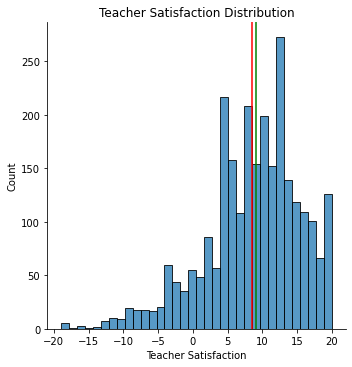

In [ ]:
#@title 
talis_mean = talis_2018['Teacher_Satisfaction_Summary'].mean()
talis_median = talis_2018['Teacher_Satisfaction_Summary'].median()
gram = sns.displot(talis_2018, x='Teacher_Satisfaction_Summary')
gram.set(xlabel = 'Teacher Satisfaction', title = 'Teacher Satisfaction Distribution')
plt.axvline(talis_mean, color="red")
plt.axvline(talis_median, color="green")

- We can see that most teacher's survey report positive levels of satisfaction. Given this lack of contrast in the data, it may be difficult to predict satisfaction
- We notice the mean and the median are closely aligned, and that the data is strongly grouped close to these values

[[]]

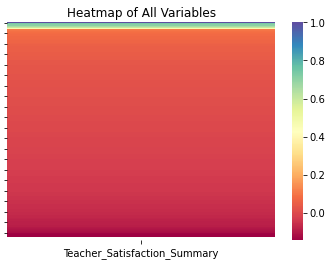

In [ ]:
#@title 
plt.figure(figsize=(6,4))
heat1 = sns.heatmap(talis_2018.corr()[['Teacher_Satisfaction_Summary']].sort_values(by=['Teacher_Satisfaction_Summary'],ascending=False), 
            cmap = 'Spectral')
heat1.set_title('Heatmap of All Variables')
heat1.set(yticklabels=[])

- We see here a correlation map. Notice that there are very few strong correlations

[]

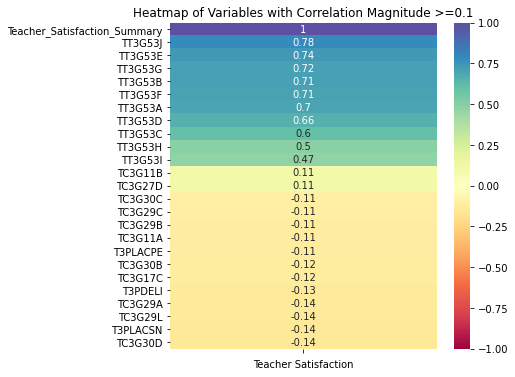

In [ ]:
#@title 
plt.figure(figsize=(6,6))
heat2 = sns.heatmap(talis_2018.corr()[['Teacher_Satisfaction_Summary']].sort_values(by=['Teacher_Satisfaction_Summary'],ascending=False).drop(talis_2018.corr().loc[(talis_2018.corr()['Teacher_Satisfaction_Summary']<0.1) & (talis_2018.corr()['Teacher_Satisfaction_Summary']> -0.1)].index).dropna(),
            vmin=-1,
            cmap='Spectral', annot = True);
heat2.set_title('Heatmap of Variables with Correlation Magnitude >=0.1')
heat2.set_xlabel('Teacher Satisfaction')
heat2.set_xticklabels([])

- Eliminating correlations with a magnitude less than 0.1, we see that the ten variables (TT3G53) used to derive our Teacher Satisfaction score have a strong correlation with Satisfaction (unsurprisingly). 
- We see a number of small correlations outside of the derivation variables:
  - Two of these are positive with magnitudes of 0.11
  - Several more are negative with magnitudes ranging from 0.11 to 0.14
  - I have chosen a selection of these for further visual analysis below

[Text(0, 0.5, 'Ratio of Parent/Guardian Funding'),
 Text(0.5, 0, 'Teacher Satisfaction'),
 Text(0.5, 1.0, 'Ratio of Private Funding compared to Teacher Satisfaction')]

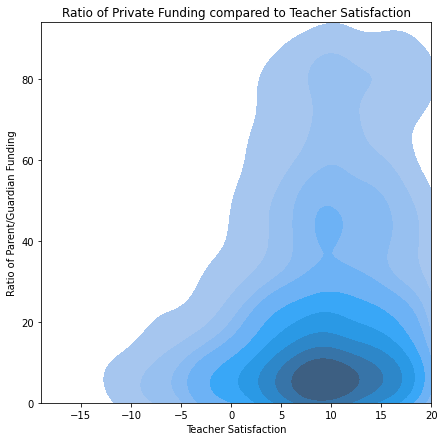

In [ ]:
#@title 
plt.figure(figsize=(7,7))
den = sns.kdeplot(data = talis_2018, x='Teacher_Satisfaction_Summary', y = 'TC3G11B',shade = True, cut = 0)
den.set(xlabel="Teacher Satisfaction", ylabel = "Ratio of Parent/Guardian Funding", title = 'Ratio of Private Funding compared to Teacher Satisfaction')

- We can see that teachers who are unsatisfied will tend to work at schools with a low ratio of parent/guardian funding.
This is not a strong association, and could easily be a confounding variable indicating socioeconomic factors. 
- We also notice the reverse trend. Teachers who work at schools with a high ratio of parent funding will tend to be satisfied.

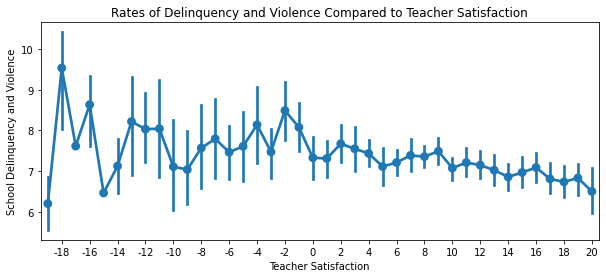

In [ ]:
#@title 
plt.figure(figsize=(10,4))
point = sns.pointplot(data = talis_2018, x='Teacher_Satisfaction_Summary', y = 'T3PDELI')
point.set(xlabel="Teacher Satisfaction", ylabel = "School Delinquency and Violence",title='Rates of Delinquency and Violence Compared to Teacher Satisfaction')

xticks=point.xaxis.get_major_ticks()
for i in range(len(xticks)):
    if i%2==0:
        xticks[i].set_visible(False)

- There appears to be a weak association between delinquency and violence rates and teacher satisfaction. Given the small data in the negative extremes, we notice that intervals are very large when compared with more highly satisfied teachers. This is a result of the limitation of our dataset. Given few reports from unsatisfied teachers, the lack of data will lead to greater uncertainty.

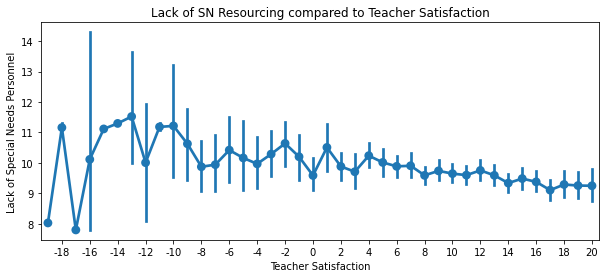

In [ ]:
#@title 
plt.figure(figsize=(10,4))
point = sns.pointplot(data = talis_2018, x='Teacher_Satisfaction_Summary', y = 'T3PLACSN')
point.set(xlabel="Teacher Satisfaction", ylabel = "Lack of Special Needs Personnel", title = 'Lack of SN Resourcing compared to Teacher Satisfaction')
xticks=point.xaxis.get_major_ticks()
for i in range(len(xticks)):
    if i%2==0:
        xticks[i].set_visible(False)

- We notice similar differences in variance as our previous point plot. In these cases related to special needs resourcing, the overall effect seems less clear. All intervals appear to overlap with each other, which the did not occur in our previous point plot. 

## <font color='lightblue'>4. Build and test a model</font>





---
# Part 3: Build a Decision Tree Model


## Step 1: Final Preparation
- create variables that will be used for training/testing split and imputation

In [ ]:
#@title 
#how to check for what you might have failed to remove later on (receieved an error about not being able to convert 'Not checked' to float, used this to print occurances in column names
for i in talis_2018.columns:
  talis_2018[i].astype('str').apply(lambda x: print(talis_2018[i].name) if x.startswith('Not checked') else 'pass')
#Create Lists of variables to maniputelate
nominal_var_list = talis_2018.select_dtypes(include = 'uint8').columns.tolist()
teach_var_list = int_list
teach_var_list.append('Teacher_Satisfaction_Summary')
non_pred_list = ['IDTEACH','TCHWGT','IDSCHOOL','SCHWGT']
non_pred_list.extend(teach_var_list)
drop_list = cmplt_ordinal_var_list
drop_list.extend(nominal_var_list)

## Step 2: Impute Data


In [ ]:
#@title 
imp=SimpleImputer(missing_values=np.NaN)
talis_2018_imp=pd.DataFrame(imp.fit_transform(talis_2018))
talis_2018_imp.columns=talis_2018.columns
talis_2018_imp.index=talis_2018.index
talis_2018_imp['Teacher_Satisfaction_Summary'] = talis_2018_imp['Teacher_Satisfaction_Summary'].astype('int')

**Action:** Use your training dataset to build a model with the goal addressing your question of interest. (Marks: 2)

## Step 3: Build Model
- Split data into training and testing data and then build the model

In [ ]:
#@title 
#split data into predictors (X) and target (y)
X = talis_2018_imp.drop(non_pred_list, axis=1)
y = talis_2018_imp['Teacher_Satisfaction_Summary']
#split these data into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
#Feature Scaling (after spliting the data!)
#numeric variables
numb_names = X_train.drop(drop_list,axis=1).select_dtypes('number').columns.tolist()
#create the standard scaler object
sc = StandardScaler()
#use this object to fit (i.e., to calculate the mean and sd of each variable in the training data) and then to transform the training data
X_train[numb_names] = sc.fit_transform(X_train[numb_names])
#use the fit from the training data to transform the test data
X_test[numb_names] = sc.transform(X_test[numb_names])
#1. Build the model
tree_reg = DecisionTreeRegressor()
#2. Fit the model to the data
tree_reg.fit(X_train, y_train)
#3. Make predictions
y_tree_pred = tree_reg.predict(X_test)
y_tree_train = tree_reg.predict(X_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3076: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.iloc._setitem_with_indexer((slice(None), indexer), value)
/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3041: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

**Q4**: Measure the performance of your model, and describe how well your model generalizes to new data (Marks: 2)

In [ ]:
#@title Calculate Mean Squared Error
#mean squared error
#mse for testing dataset
mse_test = sk.metrics.mean_squared_error(y_test, y_tree_pred) 
#mse for training dataset
mse_train = sk.metrics.mean_squared_error(y_train, y_tree_train)
#create mean guessing dataframe
num_test = talis_2018['Teacher_Satisfaction_Summary'].mean()
y_test_mean = pd.DataFrame(y_test)
y_test_mean = y_test_mean.assign(new = num_test)
y_test_mean['new']
#mse testing guess mean
mse_mean_test = sk.metrics.mean_squared_error(y_test,y_test_mean['new'])
#mse training guess mean
y_train_mean = pd.DataFrame(y_train)
y_train_mean = y_train_mean.assign(new = num_test)
y_train_mean['new']
mse_mean_train = sk.metrics.mean_squared_error(y_train,y_train_mean['new'])
print("Mean squared error train  = ", mse_train)
print('Mean squared error train guess mean = ', mse_mean_train)
print("Mean squared error test  = ", mse_test)
print('Mean squared error test guess mean = ', mse_mean_test)

Mean squared error train  =  39.12785221928213
Mean squared error train guess mean =  46.05881891091499
Mean squared error test  =  49.12917717445238
Mean squared error test guess mean =  49.09261410149938


- Unfortunately, it appears that our model does not generalize well to new data
- The mean squared error in our training data showed some promise, but when it comes to our testing data, we notice that guessing the mean is slightly more effective than using our model, indicating that we do not have particulalry high predictive power
  - This is, perhaps, not surprising. As noted previously, our data was fairly tightly grouped around the mean, and therefore guessing the mean should be a reasonably effective strategy

## <font color='lightblue'>5. Interpret your model</font>

**Q5**: Interpret your model results. E.g., what features contributed to your predictions, if possible, can you determine the sign and magnitude of the effect (Marks: 2).

In [ ]:
#@title Calculate Permutation Importance
#use permutation importance
perm_result = permutation_importance(tree_reg, X=X_test, y=y_test, scoring='neg_mean_squared_error', n_repeats=30)
#place values into a dataframe
tree_importances = pd.DataFrame({'variable':X_test.columns,'impo':perm_result.importances_mean.round(4), "sd":perm_result.importances_std.round(4)})
#sort the dataframe
print(tree_importances.sort_values(by='impo', ascending=False))

     variable    impo      sd
298   T3PDELI  2.5038  1.0090
219   TC3G29O  0.9927  0.6456
282   TC3G44H  0.8048  0.2576
208   TC3G29D  0.7183  0.4320
184   TC3G26B  0.6591  0.6030
..        ...     ...     ...
179   TC3G25E -0.1736  0.1012
157  TC3G24D1 -0.1842  0.3954
106  TC3G20J1 -0.1902  0.2479
287   TC3G45C -0.2096  0.2374
43    TC3G13E -0.2727  0.4027

[347 rows x 3 columns]


| Variable Meaning                                      | Importance | SD |   |   |
|----------------------------------------------------------------------|--------|--------|---|---|
| School Delinquency and Violence | 2.5038 | 1.0090 |   |   |
| Lack of Time with Students  | 0.9927 | 0.6456 |   |   |
| Feeling Valued by Society | 0.8048 | 0.2576 |   |   |
| Inadequecy of Instructional Materials| 0.7183 | 0.4320 |   |   |
| Providing Parents with Opportunities to be Involved in School Decisions| 0.6591 | 0.6030 |   |   |


[[],
 Text(0, 0.5, 'Variable'),
 Text(0.5, 0, 'Importance'),
 Text(0.5, 1.0, 'Permutation Importances')]

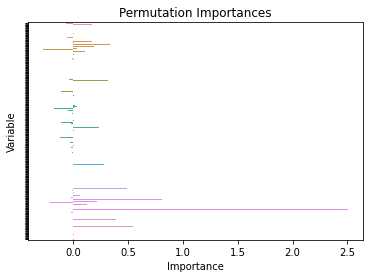

In [ ]:
#@title 
import_plot = sns.barplot(data=tree_importances, y='variable',x='impo')
import_plot.set(yticklabels=[], title = 'Permutation Importances', xlabel='Importance', ylabel='Variable')

Given that this model is a decision tree, each iteration of the training/testing split realizes slightly different decisions. However, general trends emerge:
- Violence and Deliquency in schools - Higher levels of violence tends to be given the highest importance by the model. More violence is associated with worse satisfaction
- School Resourcing (e.g.: teacher/student ratio, classroom size, materials, time with students) - poor resourcing associated with worse satisfaction
- Source of Authority for School Management - schools with decision-making bodies that are more representative of teachers are associated with higher satisfaction
- Teacher Collaboration - collaboration opportunities within school associated with higher satisfaction

In [ ]:
#@title Decision Tree
#build the figure
viz = dtreeviz(tree_reg,X_train, y_train, talis_2018.columns.to_list(),'Teacher_Satisfaction_Summary')
#take a look
viz

## <font color='lightblue'>6. Answer your question</font>

**Q6:** Use your analysis above to answer your question of interest. Did you achieve your desired outcome, and what might the next steps be? Remember to write as though you are writing to team mates working on the same/similar problem. (Marks: 3)


Note: It is ok if your analysis doesn't provide a strong answer, you can point out where it failed. If anything you can cross the approach you took off the list of possible ways to tackle your question. I.e., you still made progress!

- I did not achieve my desired outcome
- The model does flag some variables of interest, but given its weak performance, a different approach is likely necessary
  - It might not be an appropriate use of resources to study these variables in depth, given the lack of predictive power
- Possible Future Approaches:
  - Further Data Collection on Teachers with Adjustments:
    - Data collection might not be capturing dissatisfied teachers due to survivorship bias. Could try to measure staff-turnover as an alternative operationalized variable
    - Likert-like scale might not be fine-tuned enough to capture details of satisfaction. Consider creating a Scale-based variable in future data collection
    - Ask dissatisfied teachers "Why" they are dissatisfied as an intial exploratory approach
  - Further Data Collection on Principals with Adjustments:
    - Self-Assessment might not accuarately capture performance, use a different type of assessment instead, either from an observer, or from teachers
    - All training/mentoring is treated equally, perhaps some training is quite effective and other training is ineffective. Measures could be put in place to detect the type of training and look for correlations
  - Overcome Sample Selection Bias:
    - All surveys are conducted online, and take a large amount of time to complete. A stressed teacher or principal might not complete such a survey
    - Perhaps look to do a small sample but more rigorous survey instead
  - Look Further Afield:
    - Perhaps most principals in Australia are using similar processes and making similar decisions, leading to similar outcomes. Trying to use this model (with necessary adjustments) in other educational contexts might yeild different results. 
  - Find a Different Performance Metric
    - I wanted to tackle a question that would be of use to a school administrator; if it turns out that most teachers are satisfied (as it appears), then perhaps this is not a particularly useful question. Look to school administrators to find out what major issues they are facing and what solutions they are trying for a new project
  
Solutions that don't seem ideal:
- Try a different model
  - Given the weak correlations (most of which could have been from interactions with socioeconomic effects), I suspect there is not much to find even with a different methodology. 
- Increase sample size
  - Our model already features a large amount of data, I do not think that increasing the sample size from the same region will accomplish anything. 

---

